In [71]:
import pandas as pd
import importlib

import sys
sys.path.append('../')

import importlib
import mia
import utils
importlib.reload(mia)
importlib.reload(utils)

from utils import *
from mia import *

In [72]:
checkpoint_names_txt = "./olmo1b_revisions_selected.txt"
with open(checkpoint_names_txt, "r", encoding="utf-8") as f:
    checkpoints_range = [line.strip() for line in f]

checkpoints_range = [i.split('-')[0][4:] for i in checkpoints_range]
k_values = [int(i) for i in checkpoints_range]

loss_columns = [f'loss_{k}' for k in checkpoints_range]

target_fpr = 0.01

## Wikipedia Olmo 1B

In [25]:
seq_lens = [64, 128, 256, 512, 1024, 2048]
dataset_wiki_olmo1b = {}
subdomain = 'wiki'

for seqlen in seq_lens:
    with open(f"../../data/olmo/{subdomain}/olmo1b_processed/olmo_{subdomain}_seqlen{seqlen}_OLMo-1B_processed.pkl", "rb") as f:
        dataset_wiki_olmo1b[seqlen] = pd.read_pickle(f)


In [26]:
dataset_wiki_olmo1b["seq_len=64"] = dataset_wiki_olmo1b.pop(64)
dataset_wiki_olmo1b["seq_len=128"] = dataset_wiki_olmo1b.pop(128)
dataset_wiki_olmo1b["seq_len=256"] = dataset_wiki_olmo1b.pop(256)
dataset_wiki_olmo1b["seq_len=512"] = dataset_wiki_olmo1b.pop(512)
dataset_wiki_olmo1b["seq_len=1024"] = dataset_wiki_olmo1b.pop(1024)
dataset_wiki_olmo1b["seq_len=2048"] = dataset_wiki_olmo1b.pop(2048)

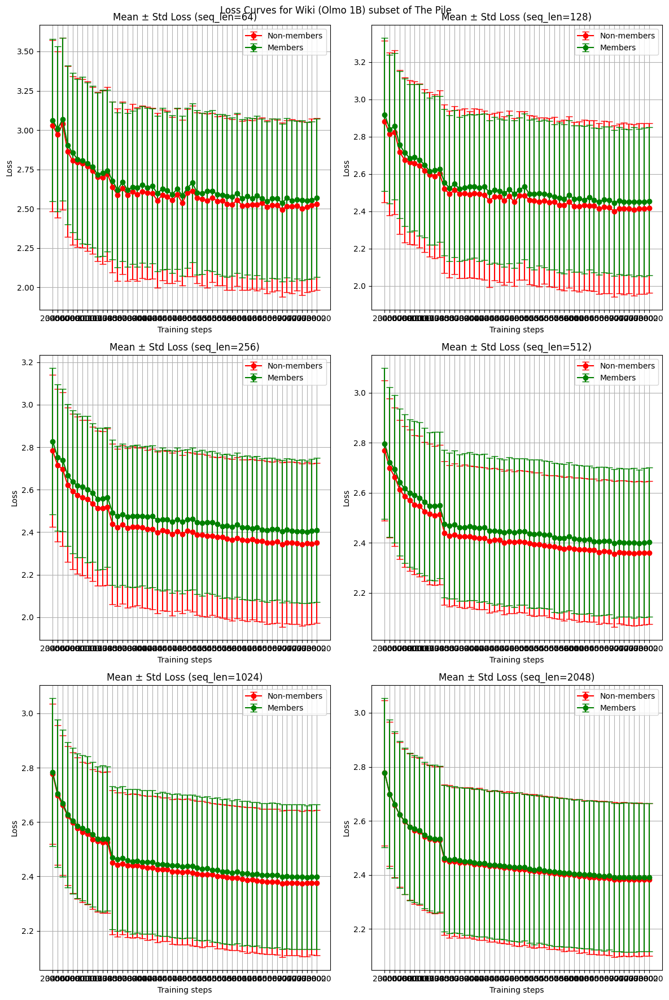

In [33]:
plot_loss_curves(dataset_wiki_olmo1b, "Wiki (Olmo 1B)", loss_columns=loss_columns, k_values=checkpoints_range)

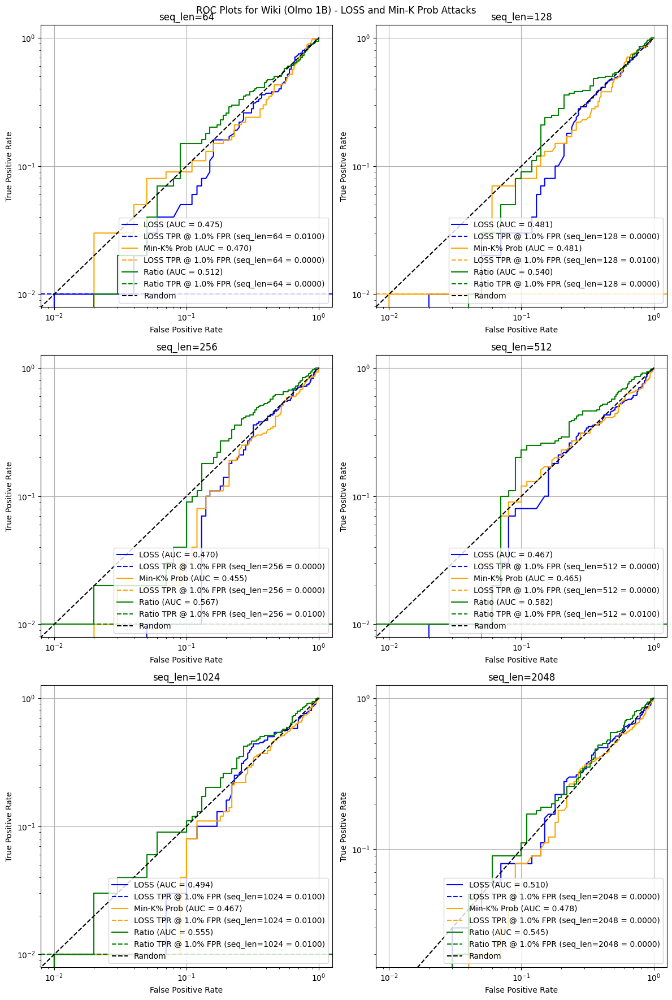

In [73]:
wiki_loss_aucs, wiki_loss_tpr_at_target, wiki_minkprob_aucs, wiki_minkprob_tpr_at_target, wiki_ratio_aucs, wiki_ratio_tpr_at_target = plot_roc_curves(dataset_wiki_olmo1b, "Wiki (Olmo 1B)", target_fpr, loss_columns)

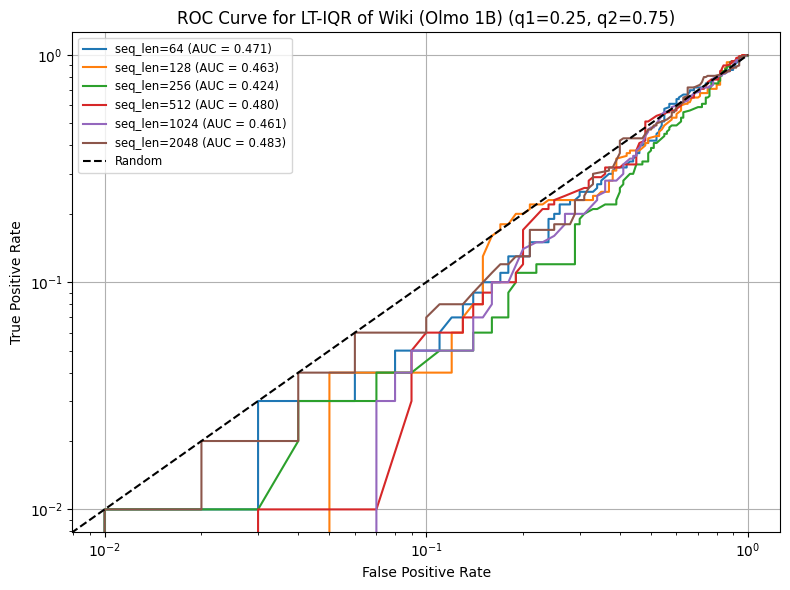

In [36]:
wiki_144_cp_aucs, wiki_144_cp_tpr = plot_roc_iqr_single_plot(dataset_wiki_olmo1b, loss_columns, "Wiki (Olmo 1B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/

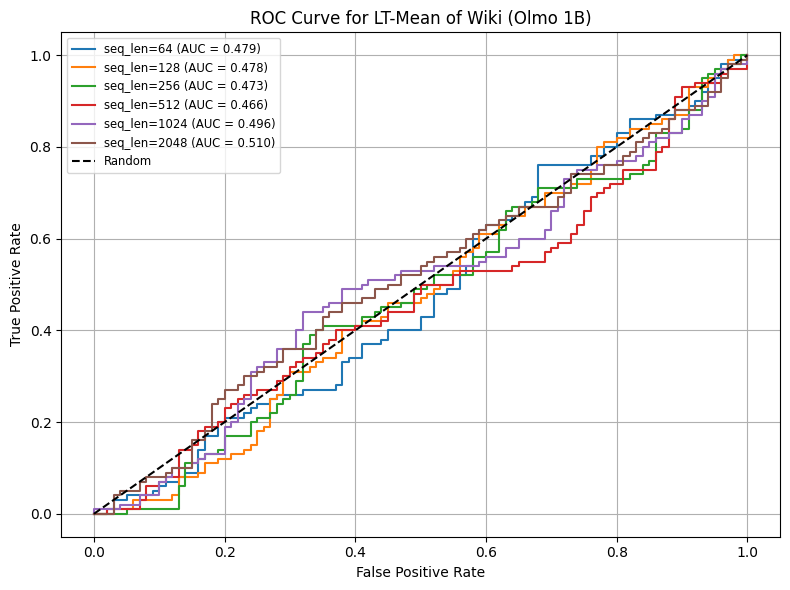

In [37]:
wiki_144_cp_mean_aucs, wiki_144_cp_mean_tprs = plot_loss_trace_mean(dataset_wiki_olmo1b, loss_columns, "Wiki (Olmo 1B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/o

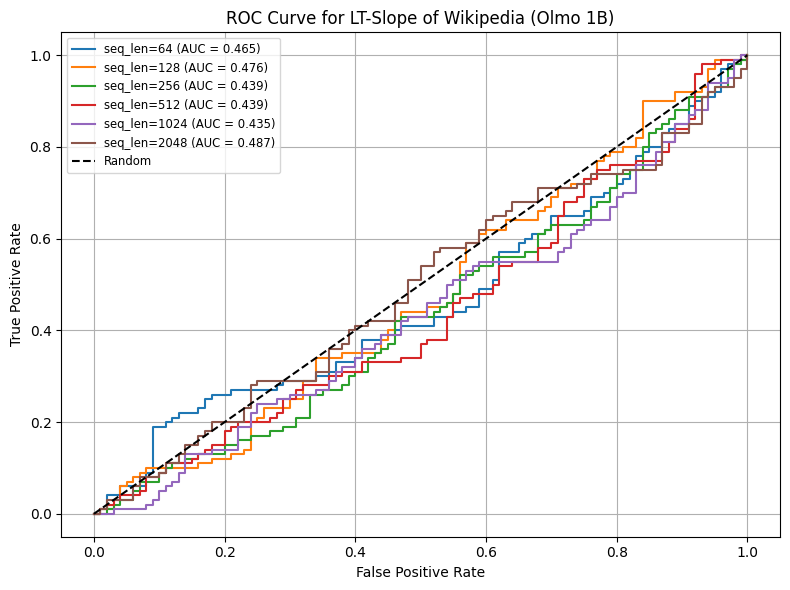

In [38]:
wiki_144_cp_slope_aucs, wiki_144_cp_slope_tpr = plot_loss_trace_slope(dataset_wiki_olmo1b, loss_columns, "Wikipedia (Olmo 1B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../mia.py:63: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['clfa'] = clfa_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../mia.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = clfa_normalized
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../mia.py:63: Performa

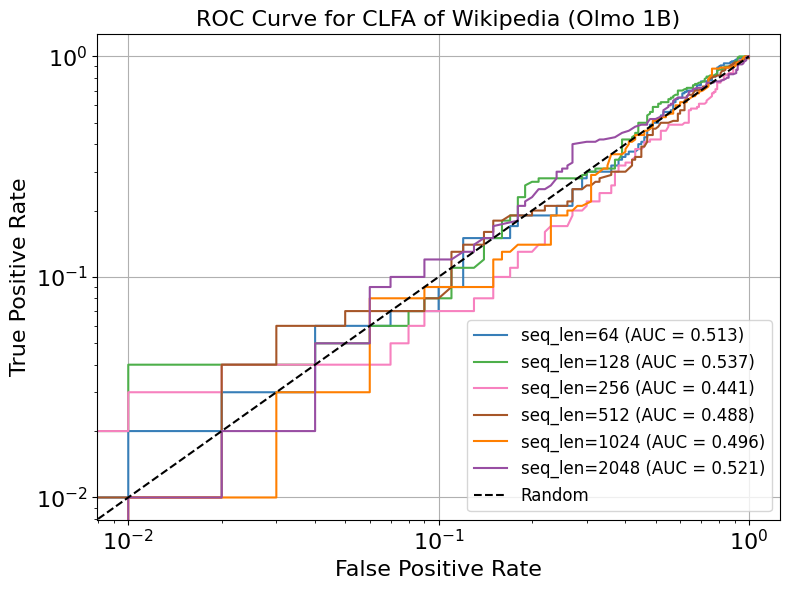

In [39]:
wiki_144_cp_clfa_aucs, wiki_144_cp_clfa_tprs = plot_clfa_normalized(dataset_wiki_olmo1b, loss_columns, "Wikipedia (Olmo 1B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imp

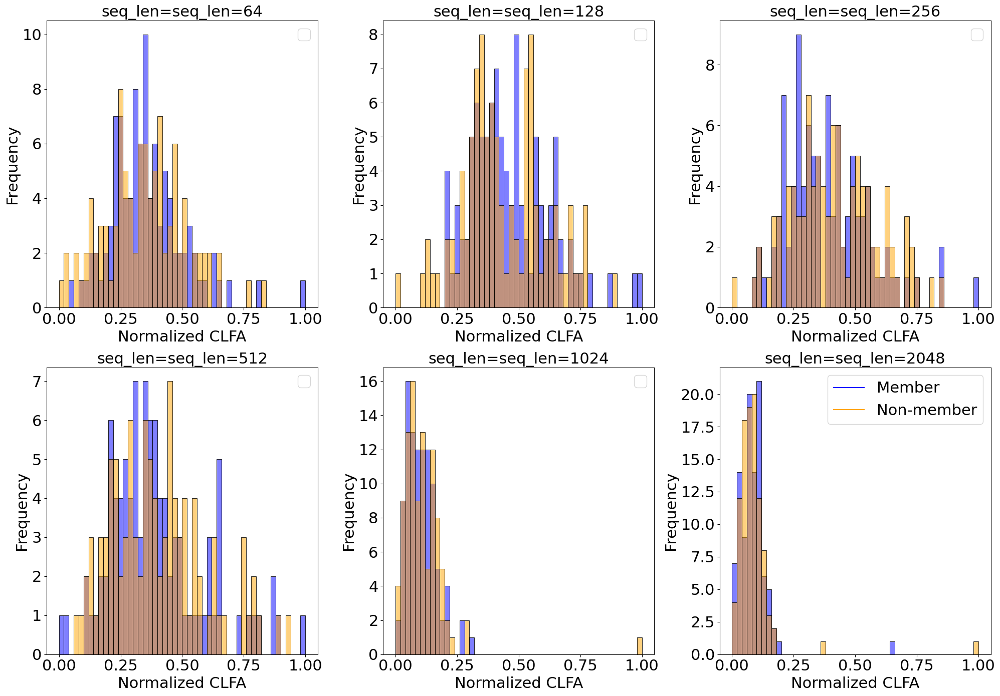

In [40]:
plot_clfa_norm_distribution(dataset_wiki_olmo1b, "Wiki (Olmo 1B)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:403: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_mean'] = fod_stats['fod_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:404: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_abs_mean'] = fod_stats['fod_abs_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpo

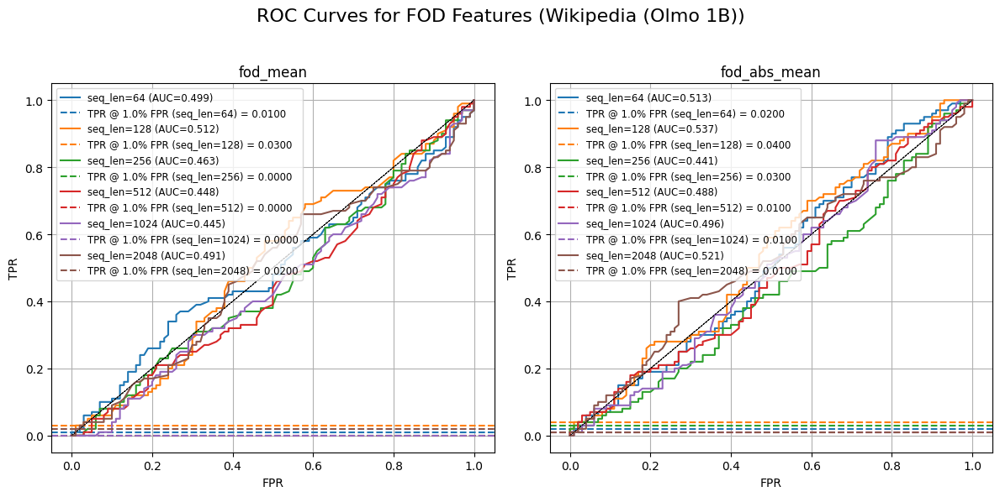

In [90]:
wiki_144_fod_mean, wiki_144_fod_mean_tpr, wiki_144_fod_abs_mean, wiki_144_fod_abs_mean_tpr = plot_fod(dataset_wiki_olmo1b, "Wikipedia (Olmo 1B)", loss_columns,target_fpr)

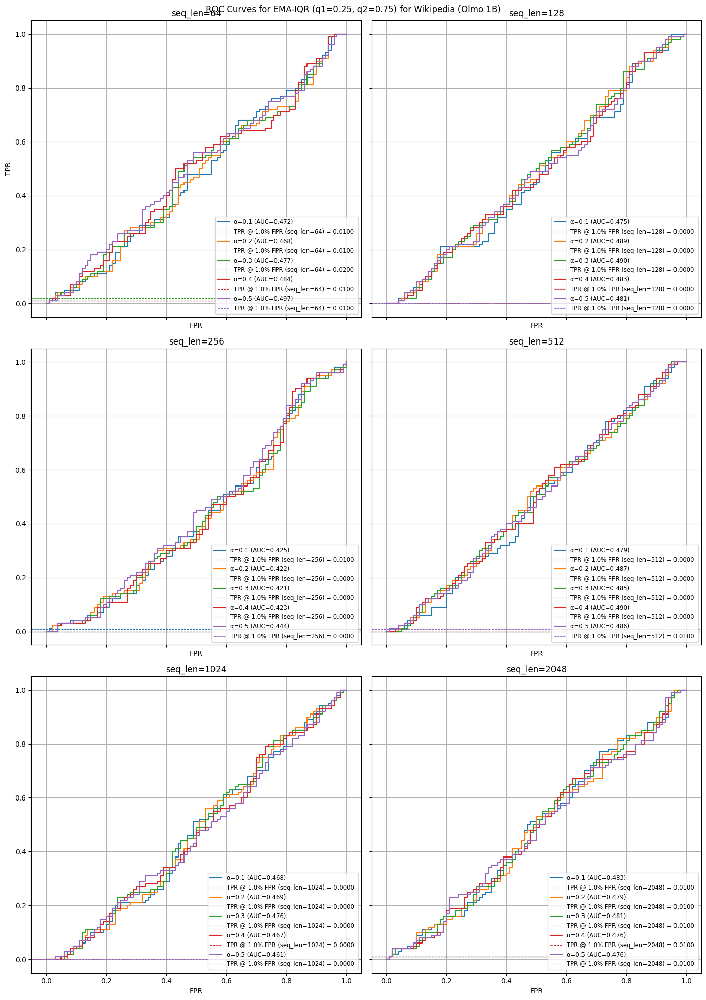

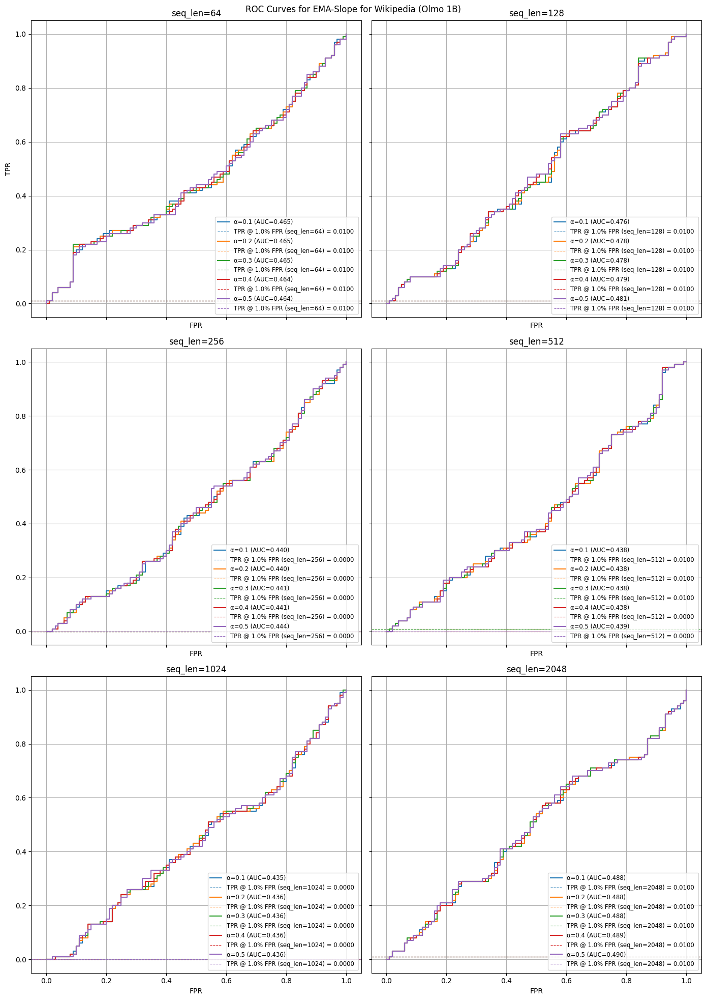

In [42]:
dataset_ema_wiki_144_olmo1b = {}
wiki_144_cp_ema_iqr_aucs, wiki_144_cp_ema_iqr_tprs, wiki_144_cp_ema_slope_aucs, wiki_144_cp_ema_slope_tprs = compute_and_plot_ema_df(dataset_wiki_olmo1b, dataset_ema_wiki_144_olmo1b, "Wikipedia (Olmo 1B)", loss_columns, target_fpr)

### Normalised Loss Traces (Wiki Olmo 1B)

In [43]:
dataset_wiki_olmo1b_normalised = normalize_loss_dfs(dataset_wiki_olmo1b, loss_columns)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


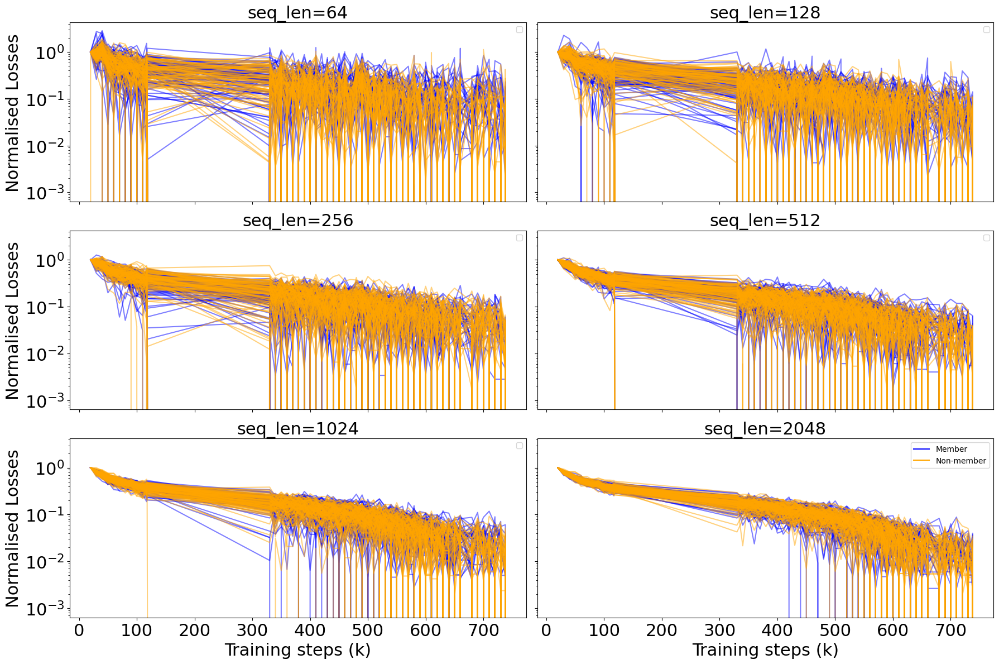

In [ ]:
plot_indv_loss_curves(dataset_wiki_olmo1b_normalised, k_values, "Wiki Normalised Losses (Olmo 1B)")

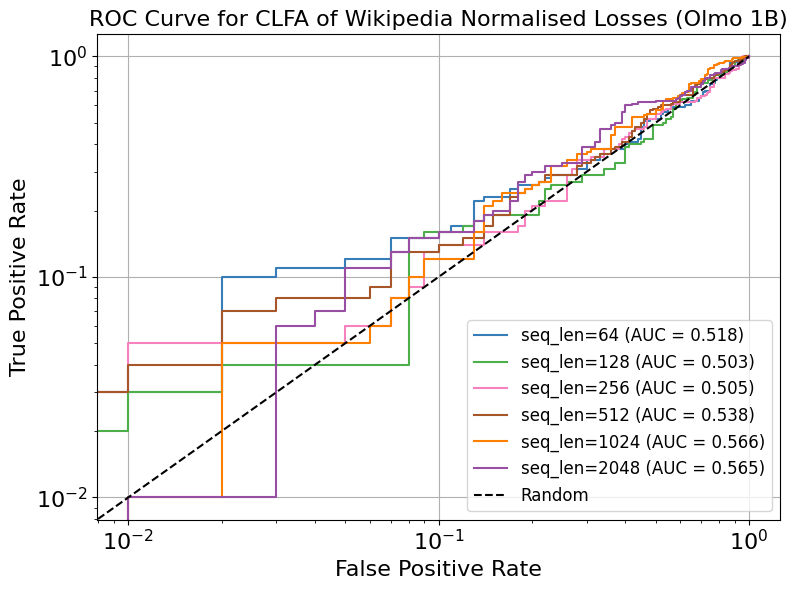

In [45]:
wiki_144_cp_norm_clfa_aucs, wiki_144_cp_norm_clfa_tprs = plot_clfa_normalized(dataset_wiki_olmo1b_normalised, loss_columns, "Wikipedia Normalised Losses (Olmo 1B)", target_fpr, True)

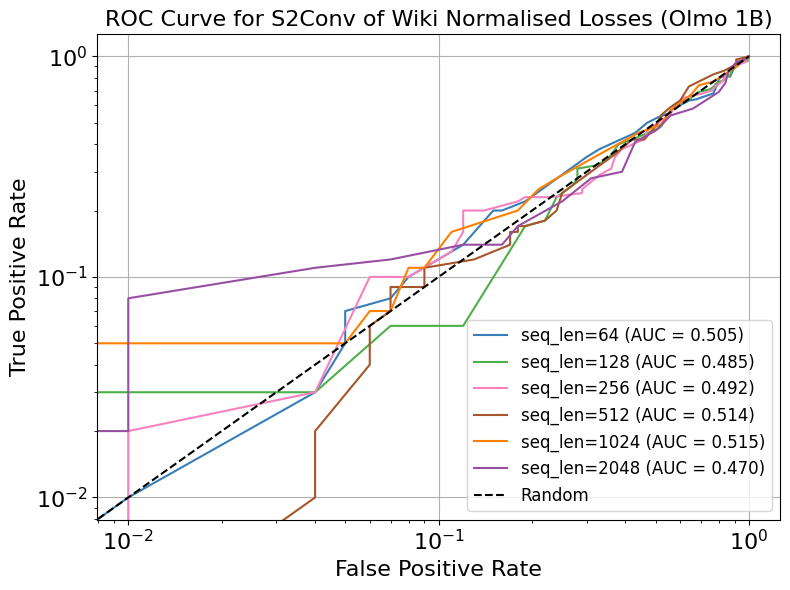

In [46]:
wiki_144_cp_norm_s2conv_aucs, wiki_144_cp_norm_s2conv_tprs = plot_steps_to_convergence(dataset_wiki_olmo1b_normalised, loss_columns, "Wiki Normalised Losses (Olmo 1B)", target_fpr, epsilon=0.05, final_fraction=0.1)

## Stack Olmo 1B

In [65]:
seq_lens = [64, 128, 256, 512, 1024, 2048]
dataset_stack_olmo1b = {}
subdomain = 'stack'

for seqlen in seq_lens:
    with open(f"../../data/olmo/{subdomain}/olmo1b_processed/olmo_{subdomain}_seqlen{seqlen}_olmo-1b_processed.pkl", "rb") as f:
        dataset_stack_olmo1b[seqlen] = pd.read_pickle(f)


In [66]:
dataset_stack_olmo1b["seq_len=64"] = dataset_stack_olmo1b.pop(64)
dataset_stack_olmo1b["seq_len=128"] = dataset_stack_olmo1b.pop(128)
dataset_stack_olmo1b["seq_len=256"] = dataset_stack_olmo1b.pop(256)
dataset_stack_olmo1b["seq_len=512"] = dataset_stack_olmo1b.pop(512)
dataset_stack_olmo1b["seq_len=1024"] = dataset_stack_olmo1b.pop(1024)
dataset_stack_olmo1b["seq_len=2048"] = dataset_stack_olmo1b.pop(2048)

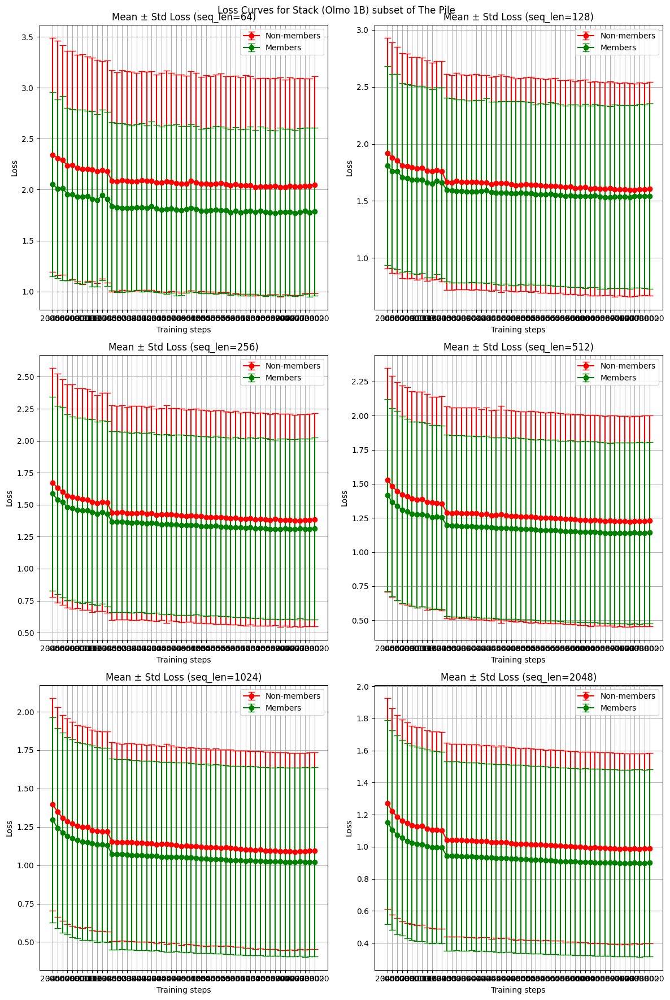

In [67]:
plot_loss_curves(dataset_stack_olmo1b, "Stack (Olmo 1B)", loss_columns=loss_columns, k_values=checkpoints_range)

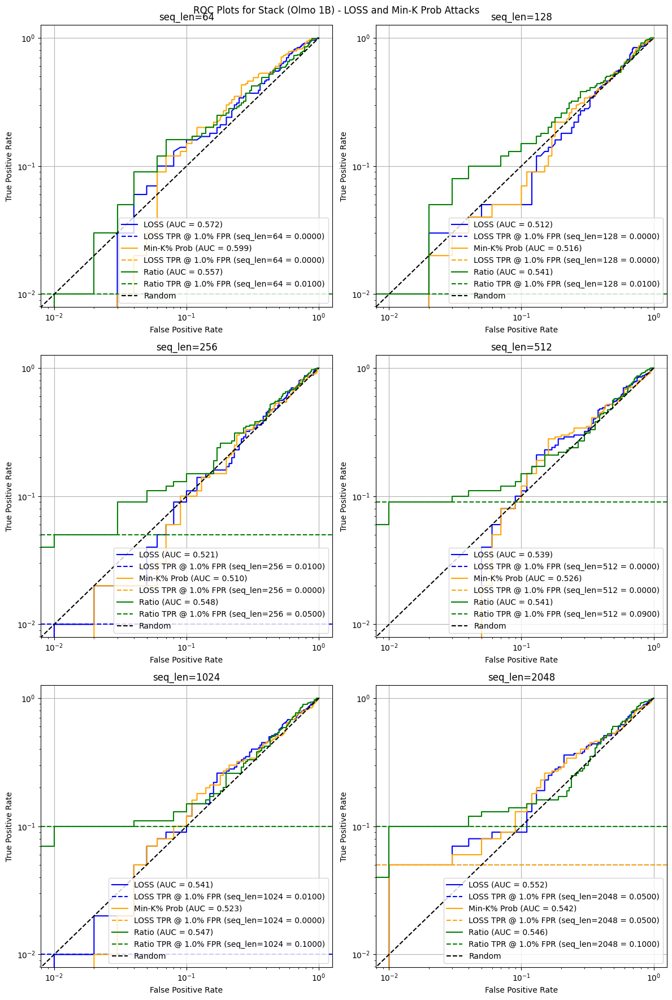

In [74]:
stack_loss_aucs, stack_loss_tpr_at_target, stack_minkprob_aucs, stack_minkprob_tpr_at_target, stack_ratio_aucs, stack_ratio_tpr_at_target = plot_roc_curves(dataset_stack_olmo1b, "Stack (Olmo 1B)", target_fpr, loss_columns)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../mia.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["loss_traces"] = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../mia.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = iqr_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/

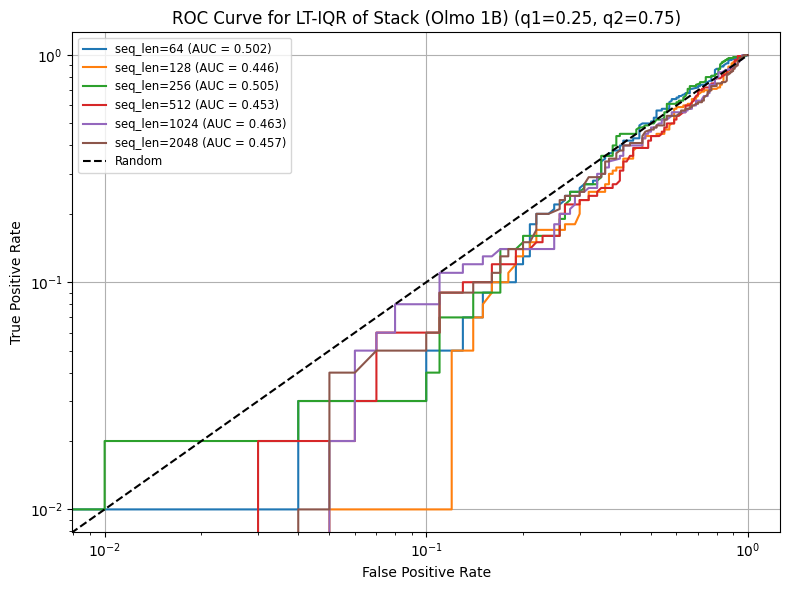

In [75]:
stack_144_cp_aucs, stack_144_cp_tpr = plot_roc_iqr_single_plot(dataset_stack_olmo1b, loss_columns, "Stack (Olmo 1B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/

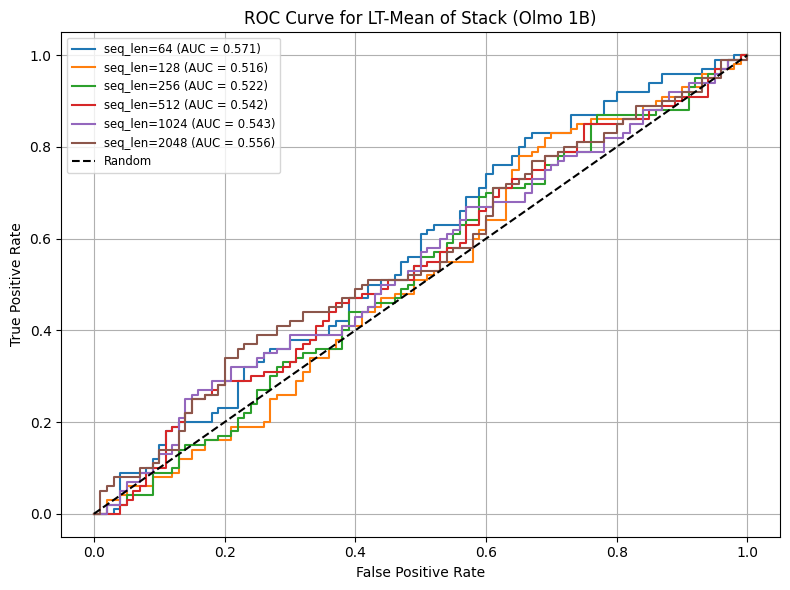

In [76]:
stack_144_cp_mean_aucs, stack_144_cp_mean_tprs = plot_loss_trace_mean(dataset_stack_olmo1b, loss_columns, "Stack (Olmo 1B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/o

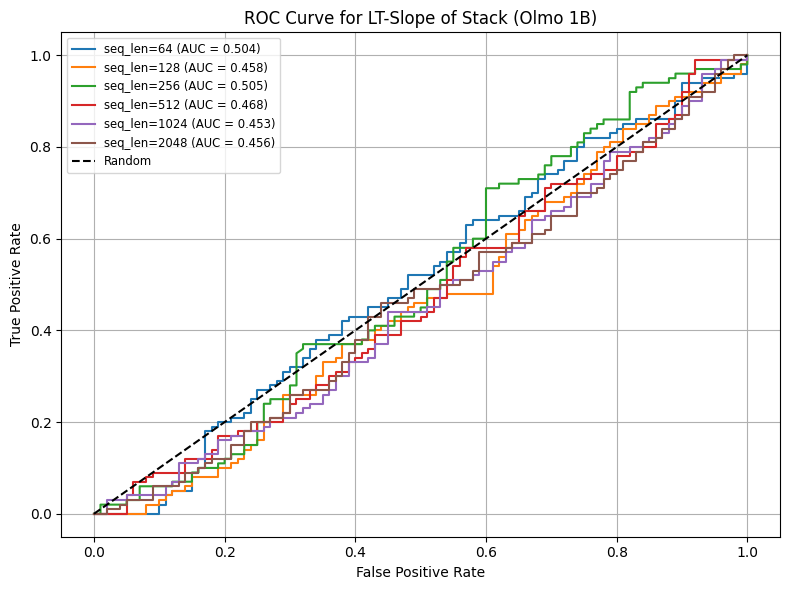

In [77]:
stack_144_cp_slope_aucs, stack_144_cp_slope_tpr = plot_loss_trace_slope(dataset_stack_olmo1b, loss_columns, "Stack (Olmo 1B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../mia.py:63: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['clfa'] = clfa_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../mia.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = clfa_normalized
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../mia.py:63: Performa

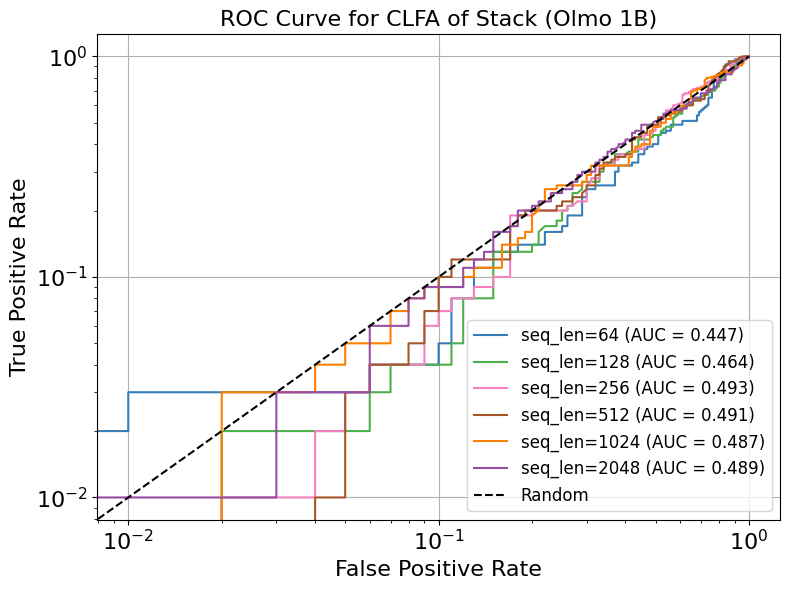

In [78]:
stack_144_cp_clfa_aucs, stack_144_cp_clfa_tprs = plot_clfa_normalized(dataset_stack_olmo1b, loss_columns, "Stack (Olmo 1B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imp

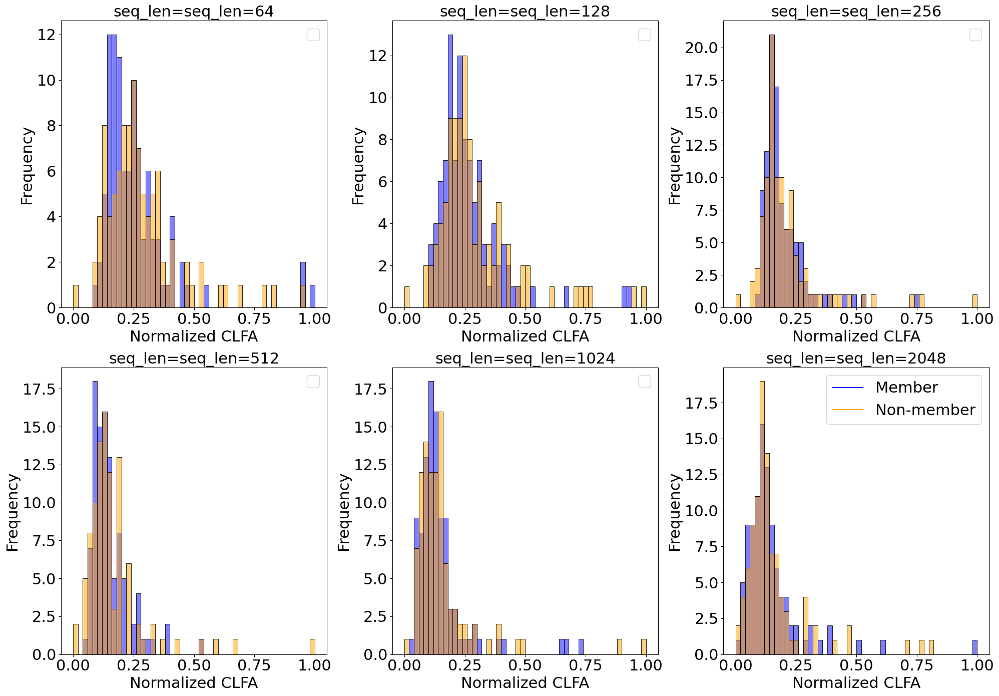

In [79]:
plot_clfa_norm_distribution(dataset_stack_olmo1b, "Stack (Olmo 1B)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:403: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_mean'] = fod_stats['fod_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:404: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_abs_mean'] = fod_stats['fod_abs_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpo

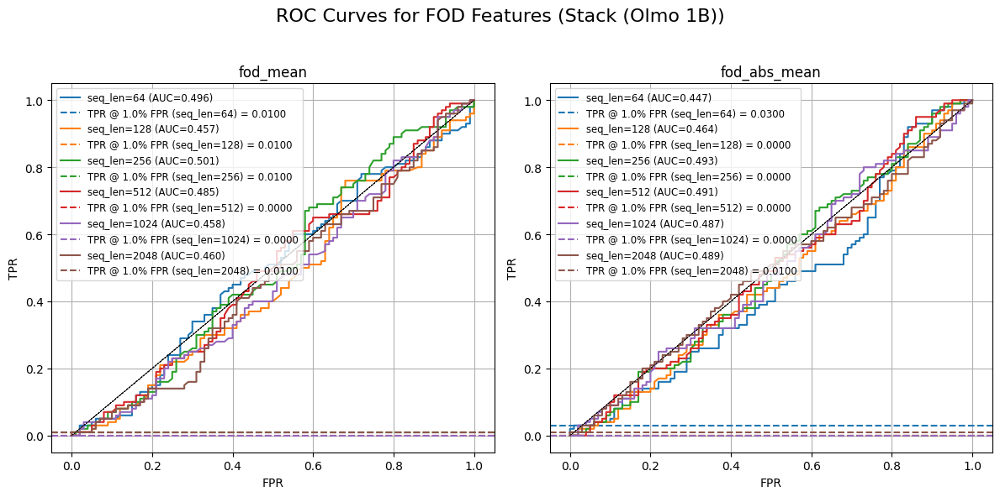

In [88]:
stack_144_fod_mean, stack_144_fod_mean_tpr, stack_144_fod_abs_mean, stack_144_fod_abs_mean_tpr = plot_fod(dataset_stack_olmo1b, "Stack (Olmo 1B)", loss_columns, target_fpr)

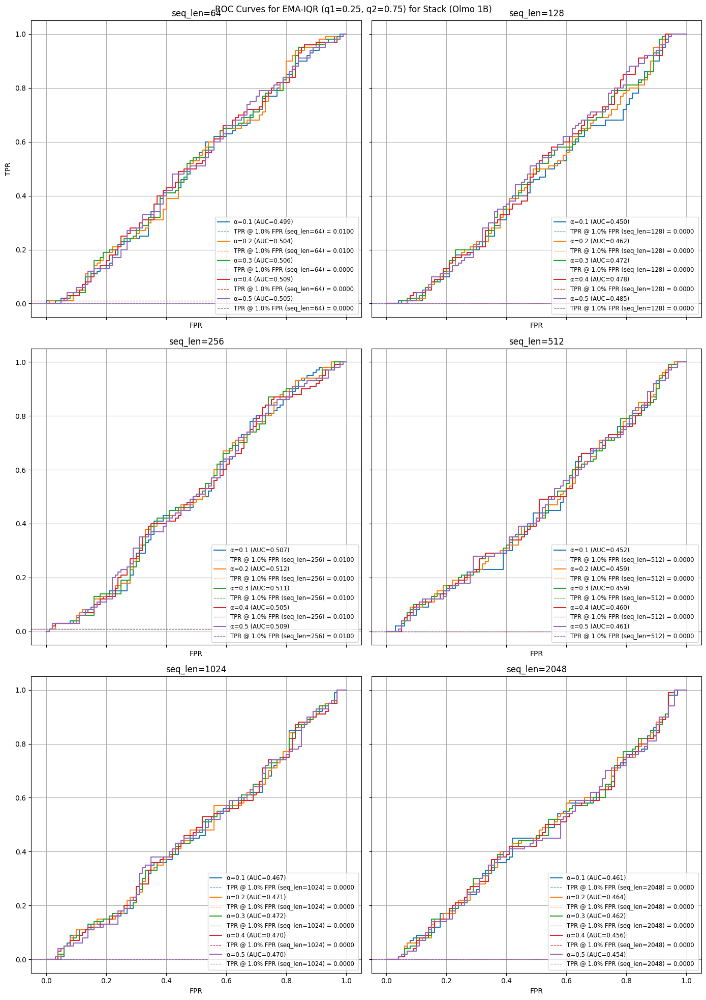

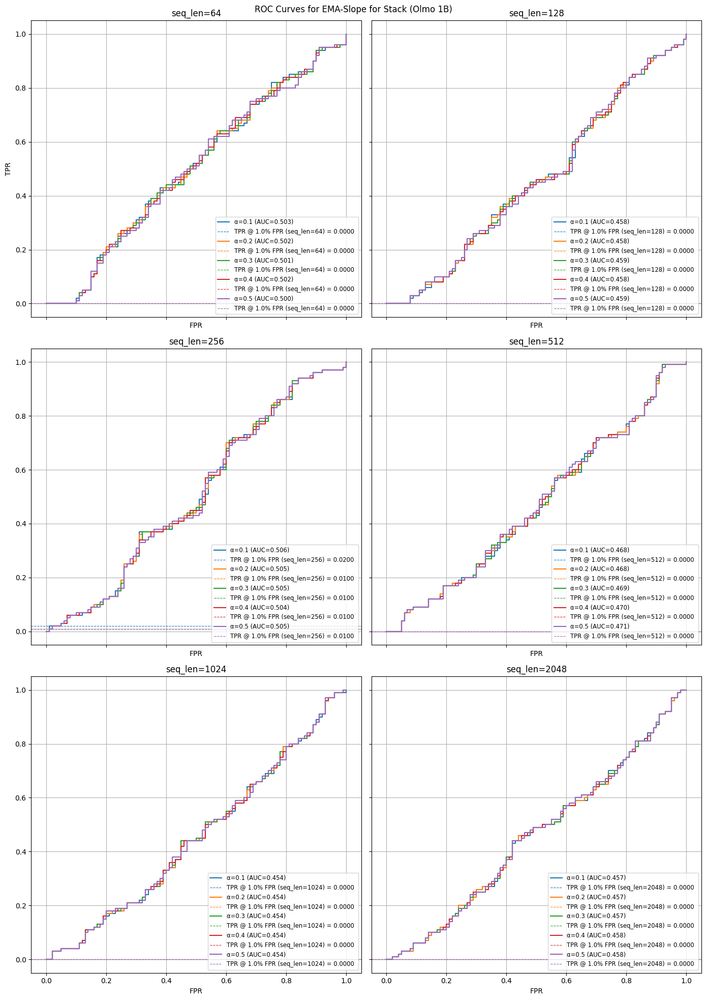

In [81]:
dataset_ema_stack_144_olmo1b = {}
stack_144_cp_ema_iqr_aucs, stack_144_cp_ema_iqr_tprs, stack_144_cp_ema_slope_aucs, stack_144_cp_ema_slope_tprs = compute_and_plot_ema_df(dataset_stack_olmo1b, dataset_ema_stack_144_olmo1b, "Stack (Olmo 1B)", loss_columns, target_fpr)

### Normalised Loss Traces (Stack Olmo 1B)

In [82]:
dataset_stack_olmo1b_normalised = normalize_loss_dfs(dataset_stack_olmo1b, loss_columns)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


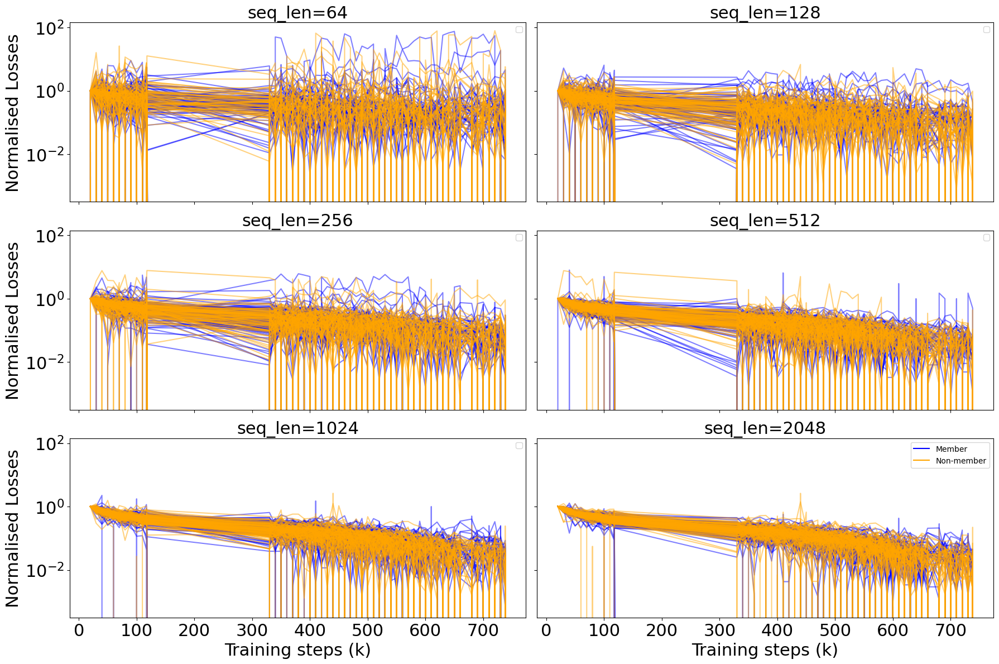

In [83]:
plot_indv_loss_curves(dataset_stack_olmo1b_normalised, k_values, "Stack Normalised Losses (Olmo 1B)")

In [85]:
dataset_stack_olmo1b_normalised['seq_len=1024'].dropna(subset=['clfa_normalized'], inplace=True)

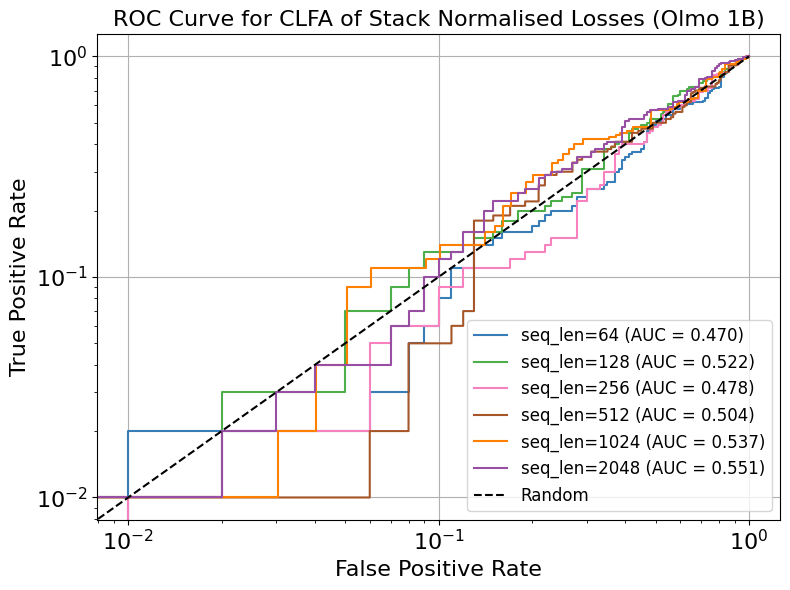

In [86]:
stack_144_cp_norm_clfa_aucs, stack_144_cp_norm_clfa_tprs = plot_clfa_normalized(dataset_stack_olmo1b_normalised, loss_columns, "Stack Normalised Losses (Olmo 1B)", target_fpr, True)

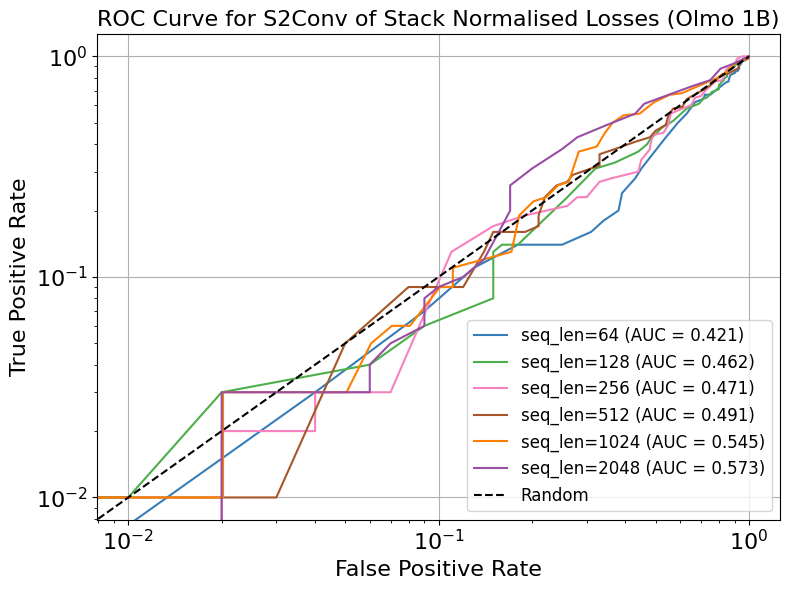

In [87]:
stack_144_cp_norm_s2conv_aucs, stack_144_cp_norm_s2conv_tprs = plot_steps_to_convergence(dataset_stack_olmo1b_normalised, loss_columns, "Stack Normalised Losses (Olmo 1B)", target_fpr, epsilon=0.05, final_fraction=0.1)

## Pes2o Olmo 1B

In [47]:
seq_lens = [64, 128, 256, 512, 1024, 2048]
dataset_pes2o_olmo1b = {}
subdomain = 'pes2o'

for seqlen in seq_lens:
    with open(f"../../data/olmo/{subdomain}/olmo1b_processed/olmo_{subdomain}_seqlen{seqlen}_olmo-1b_processed.pkl", "rb") as f:
        dataset_pes2o_olmo1b[seqlen] = pd.read_pickle(f)


In [48]:
dataset_pes2o_olmo1b["seq_len=64"] = dataset_pes2o_olmo1b.pop(64)
dataset_pes2o_olmo1b["seq_len=128"] = dataset_pes2o_olmo1b.pop(128)
dataset_pes2o_olmo1b["seq_len=256"] = dataset_pes2o_olmo1b.pop(256)
dataset_pes2o_olmo1b["seq_len=512"] = dataset_pes2o_olmo1b.pop(512)
dataset_pes2o_olmo1b["seq_len=1024"] = dataset_pes2o_olmo1b.pop(1024)
dataset_pes2o_olmo1b["seq_len=2048"] = dataset_pes2o_olmo1b.pop(2048)

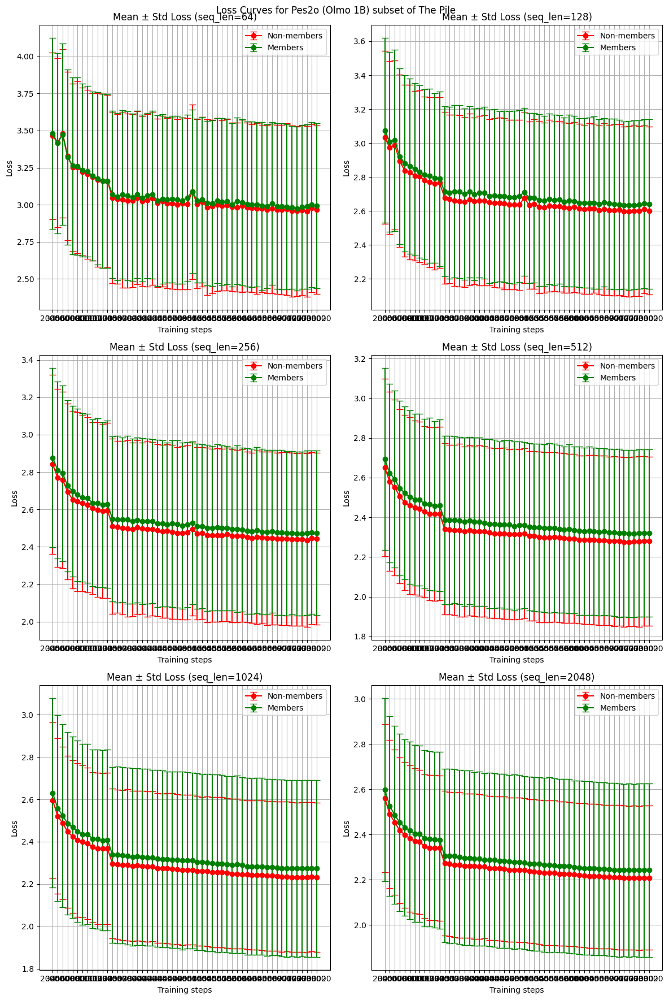

In [49]:
plot_loss_curves(dataset_pes2o_olmo1b, "Pes2o (Olmo 1B)", loss_columns=loss_columns, k_values=checkpoints_range)

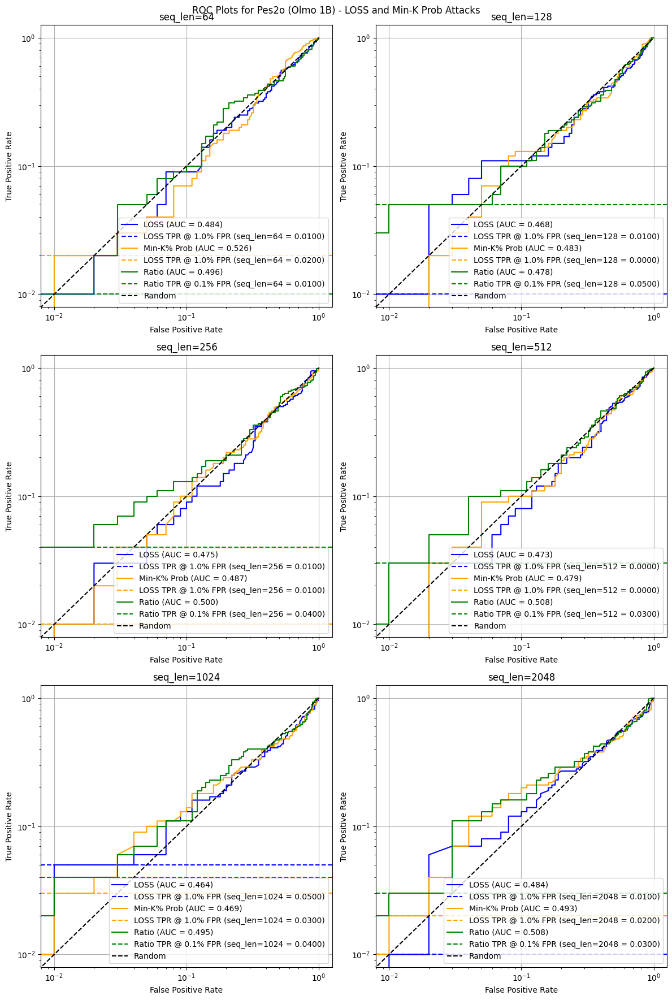

In [50]:
pes2o_loss_aucs, pes2o_loss_tpr_at_target, pes2o_minkprob_aucs, pes2o_minkprob_tpr_at_target, pes2o_ratio_aucs, pes2o_ratio_tpr_at_target =  plot_roc_curves(dataset_pes2o_olmo1b, "Pes2o (Olmo 1B)", target_fpr, loss_columns)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../mia.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["loss_traces"] = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../mia.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = iqr_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/

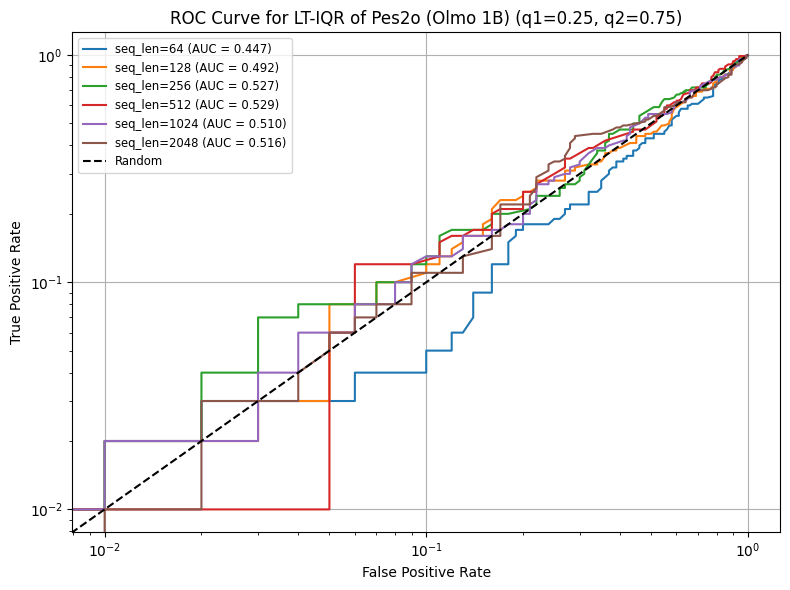

In [51]:
pes2o_144_cp_aucs, pes2o_144_cp_tpr = plot_roc_iqr_single_plot(dataset_pes2o_olmo1b, loss_columns, "Pes2o (Olmo 1B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/

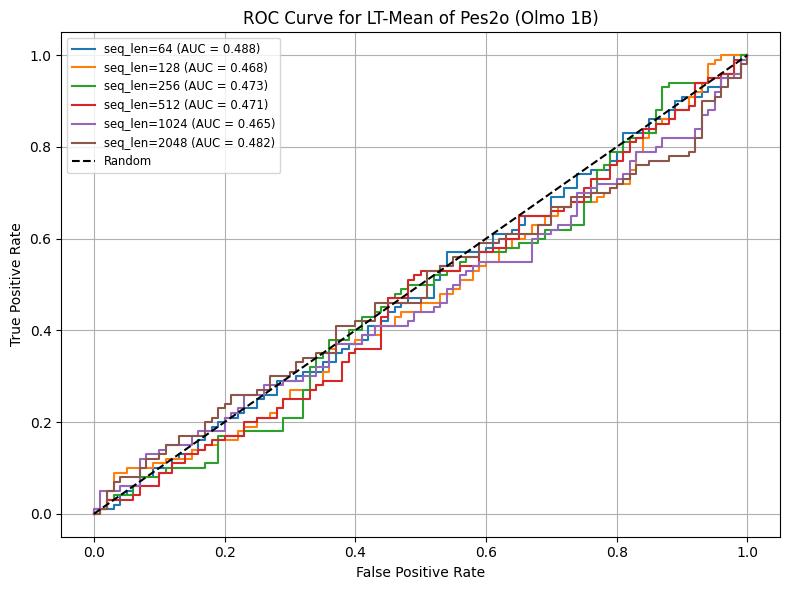

In [52]:
pes2o_144_cp_mean_aucs, pes2o_144_cp_mean_tprs = plot_loss_trace_mean(dataset_pes2o_olmo1b, loss_columns, "Pes2o (Olmo 1B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/o

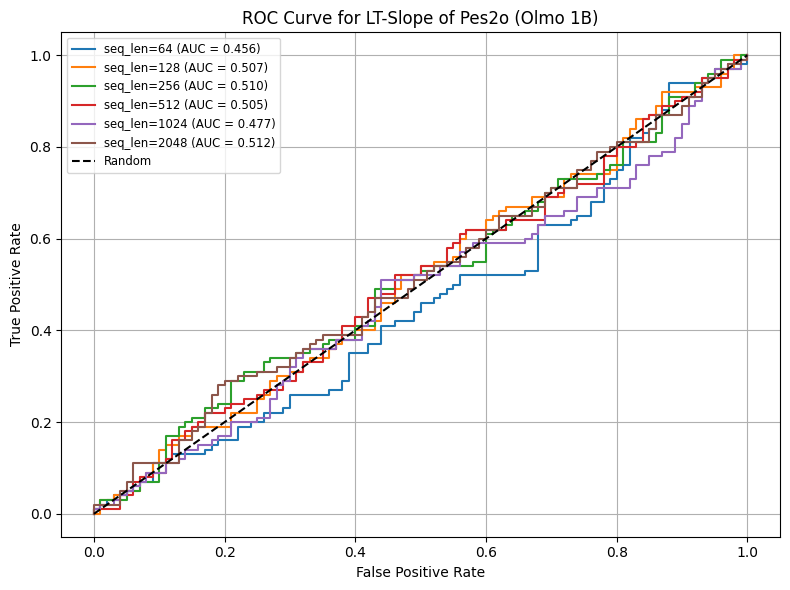

In [53]:
pes2o_144_cp_slope_aucs, pes2o_144_cp_slope_tpr = plot_loss_trace_slope(dataset_pes2o_olmo1b, loss_columns, "Pes2o (Olmo 1B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../mia.py:63: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['clfa'] = clfa_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../mia.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = clfa_normalized
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../mia.py:63: Performa

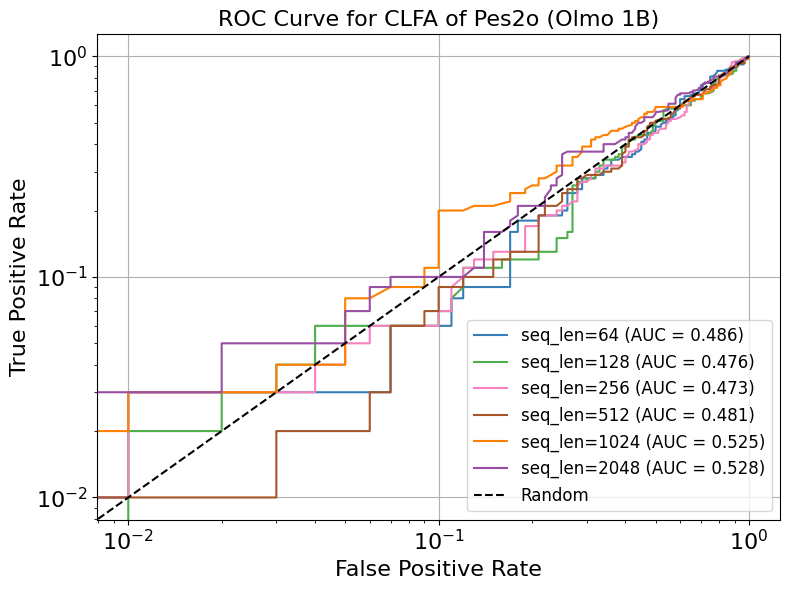

In [54]:
pes2o_144_cp_clfa_aucs, pes2o_144_cp_clfa_tprs = plot_clfa_normalized(dataset_pes2o_olmo1b, loss_columns, "Pes2o (Olmo 1B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imp

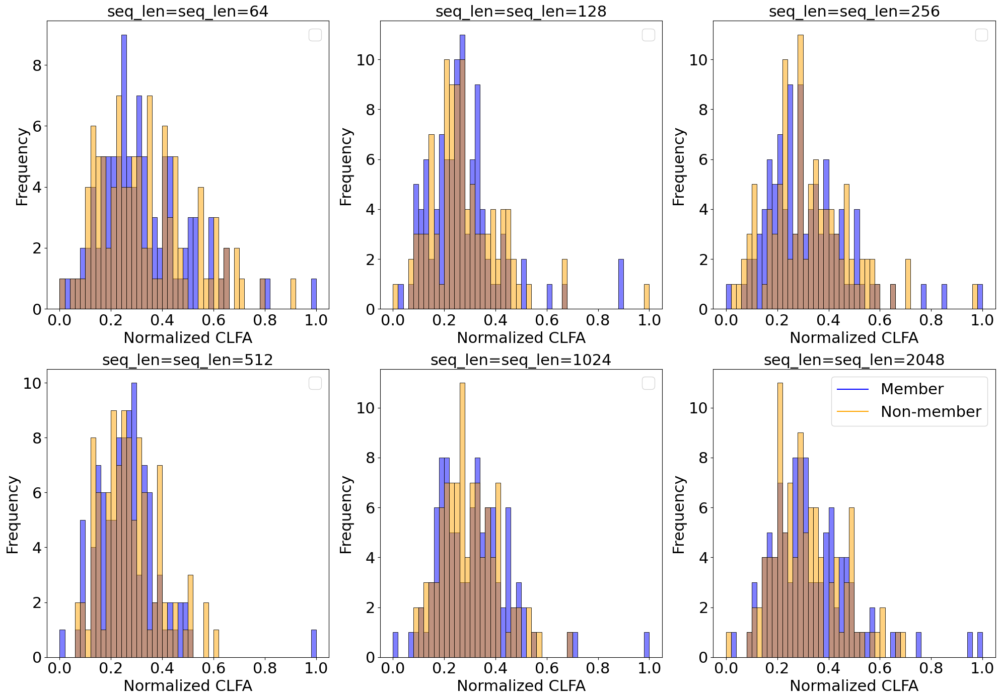

In [55]:
plot_clfa_norm_distribution(dataset_pes2o_olmo1b, "Pes2o (Olmo 1B)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:403: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_mean'] = fod_stats['fod_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:404: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_abs_mean'] = fod_stats['fod_abs_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpo

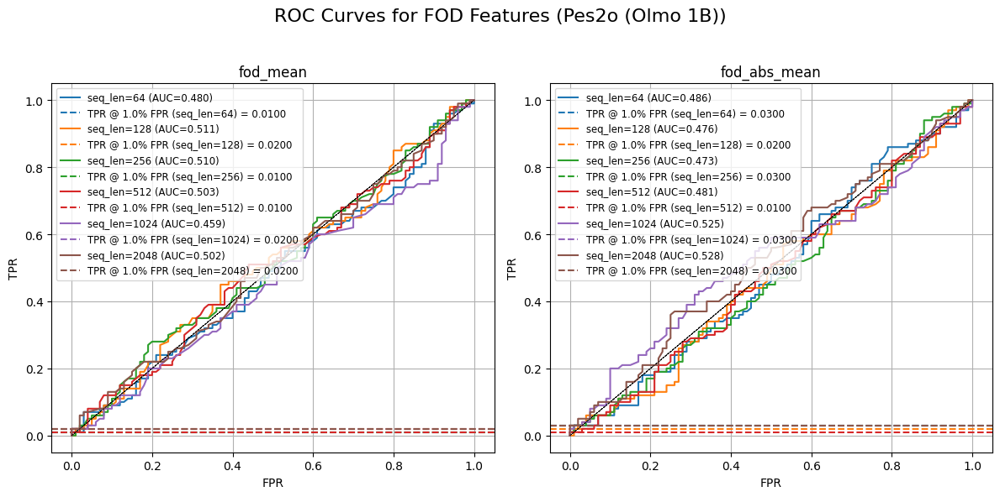

In [89]:
pes2o_144_fod_mean, pes2o_144_fod_mean_tpr, pes2o_144_fod_abs_mean, pes2o_144_fod_abs_mean_tpr = plot_fod(dataset_pes2o_olmo1b, "Pes2o (Olmo 1B)", loss_columns, target_fpr)

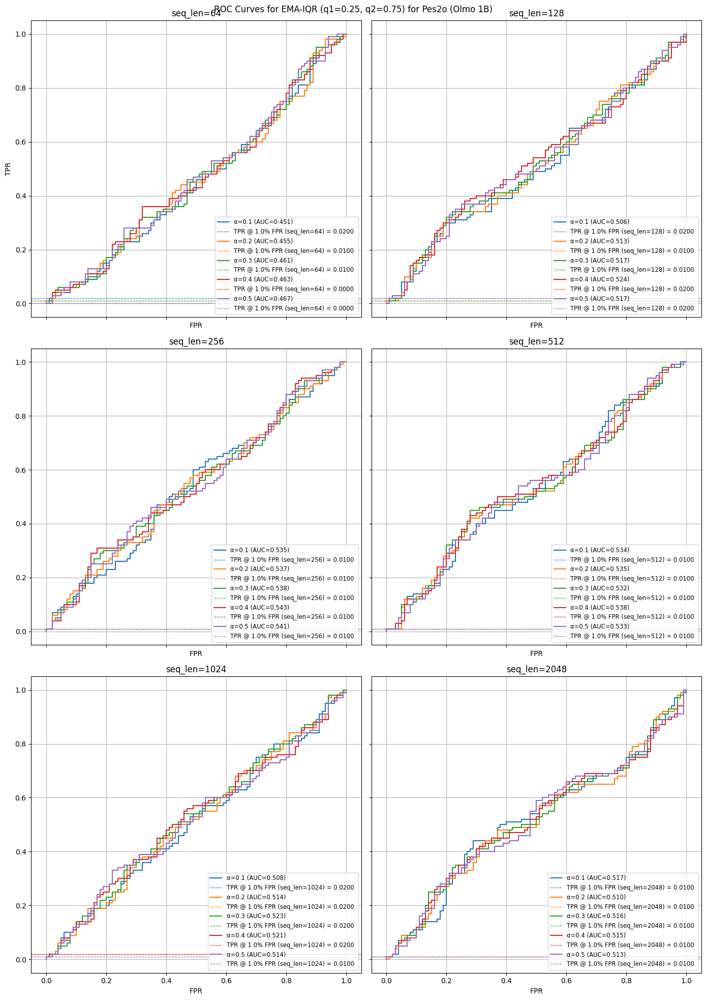

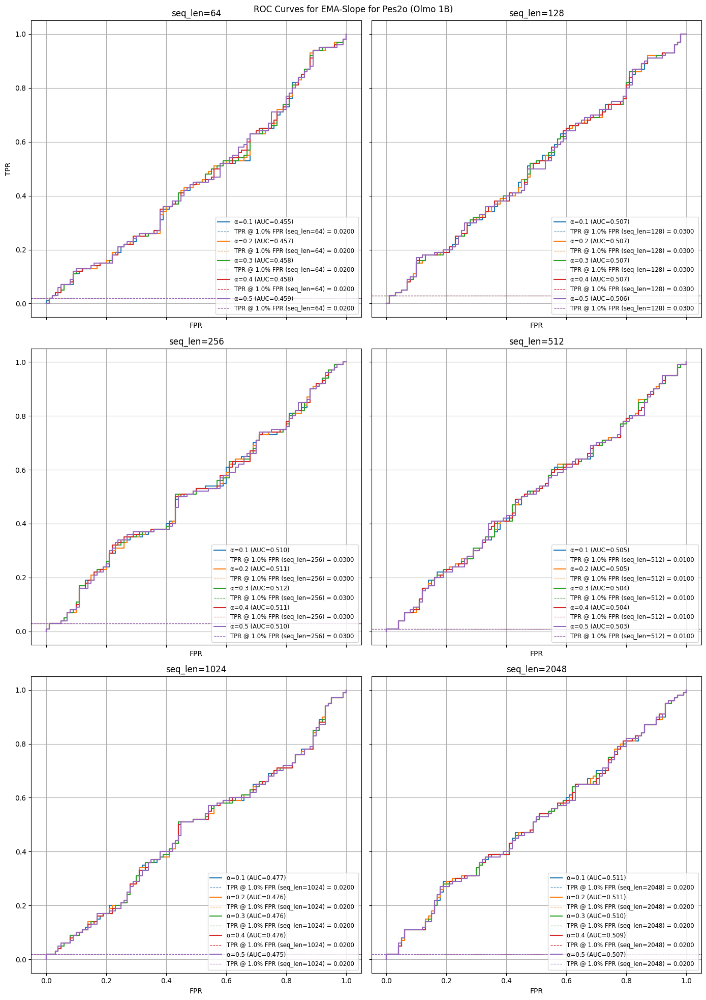

In [57]:
dataset_ema_pes2o_144_olmo1b = {}
pes2o_144_cp_ema_iqr_aucs, pes2o_144_cp_ema_iqr_tprs, pes2o_144_cp_ema_slope_aucs, pes2o_144_cp_ema_slope_tprs = compute_and_plot_ema_df(dataset_pes2o_olmo1b, dataset_ema_pes2o_144_olmo1b, "Pes2o (Olmo 1B)", loss_columns, target_fpr)

### Normalised Loss Traces (Pes2o Olmo 1B)

In [58]:
dataset_pes2o_olmo1b_normalised = normalize_loss_dfs(dataset_pes2o_olmo1b, loss_columns)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/olmo/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


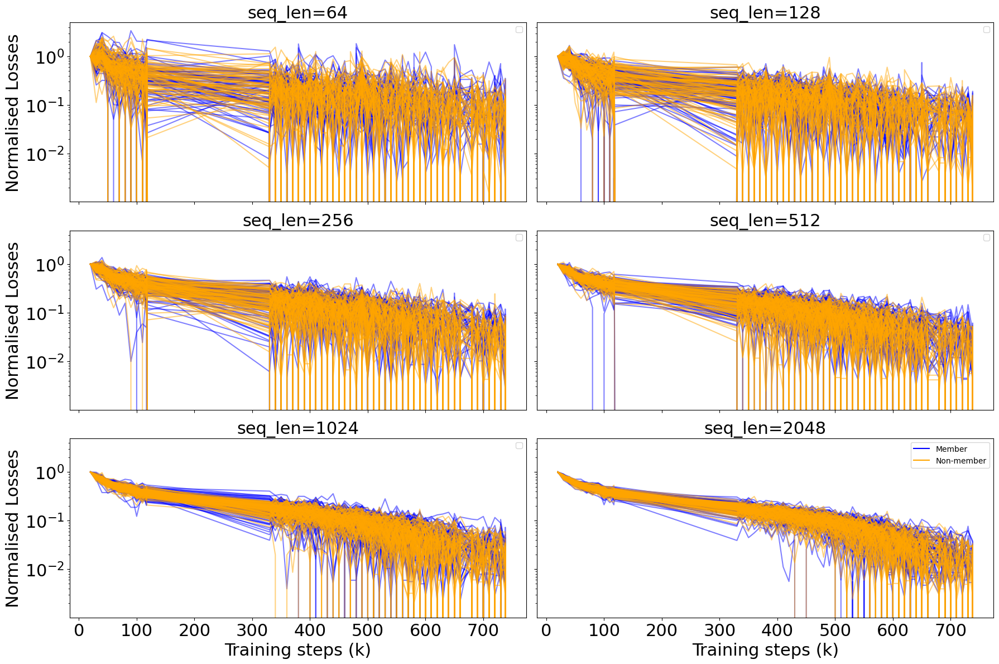

In [62]:
plot_indv_loss_curves(dataset_pes2o_olmo1b_normalised, k_values, "Pes2o Normalised Losses (Olmo 1B)")

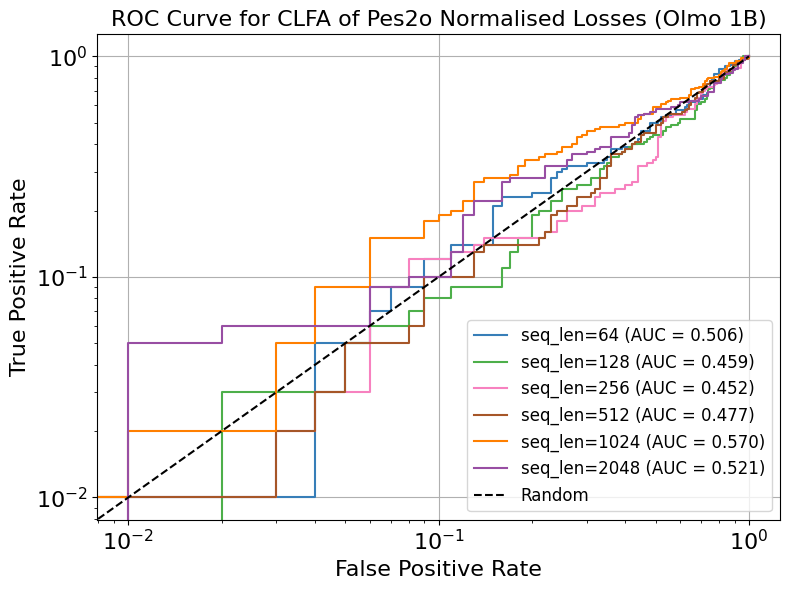

In [63]:
pes2o_144_cp_norm_clfa_aucs, pes2o_144_cp_norm_clfa_tprs = plot_clfa_normalized(dataset_pes2o_olmo1b_normalised, loss_columns, "Pes2o Normalised Losses (Olmo 1B)", target_fpr, True)

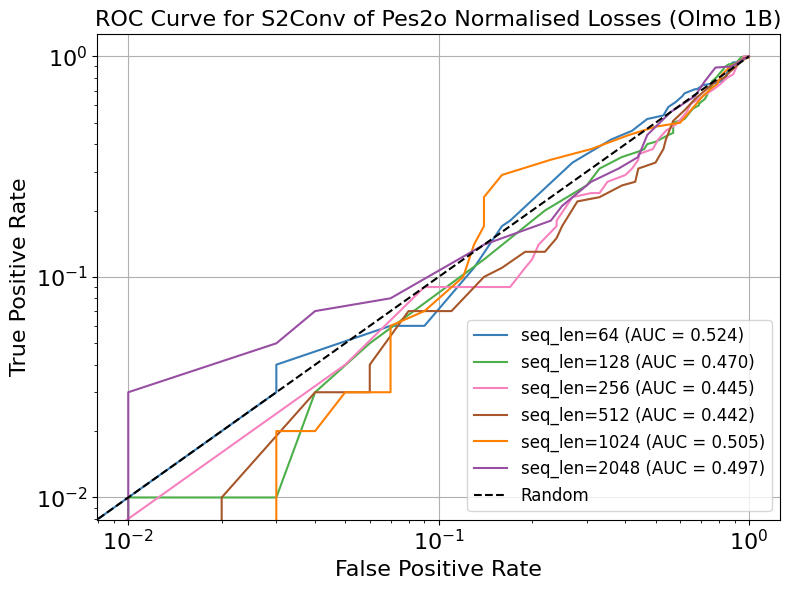

In [64]:
pes2o_144_cp_norm_s2conv_aucs, pes2o_144_cp_norm_s2conv_tprs = plot_steps_to_convergence(dataset_pes2o_olmo1b_normalised, loss_columns, "Pes2o Normalised Losses (Olmo 1B)", target_fpr, epsilon=0.05, final_fraction=0.1)